In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import METRICS, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS, read_files,\
    top_mean_dev_auc, top_mean_validation_auc, rolling_min_dev_auc, top_min_whole_validation_auc,\
    top_min_dev_auc, top_min_validation_auc, read_files

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
SET_PARAMETERS.remove('param_is_unbalance')
CONT_PARAMETERS.remove('param_scale_pos_weight')
CONT_PARAMETERS.remove('param_bagging_fraction')
INT_PARAMETERS.remove('param_bagging_freq')

In [5]:
files = [ './experiments/thin-only.pkl',
         './experiments/thin.pkl'
]

In [6]:
top_k = 50000
min_iterations = 50

In [7]:
best_mean_dev = top_mean_dev_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
best_mean_dev.groupby(['file', 'experiment_id']).ngroups

263

In [8]:
best_min_dev = top_min_dev_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
best_min_dev.groupby(['file', 'experiment_id']).ngroups

279

In [9]:
true_best = top_min_whole_validation_auc(read_files(files), top_k)\
    .pipe(lambda x: x[x.groupby(['file', 'experiment_id']).iteration.transform('size') > min_iterations])
true_best.groupby(['file', 'experiment_id']).ngroups

229

In [10]:
compare_columns = ['mean_dev_auc', 'mean_validation_auc',
               'mean_whole_validation_auc', 'min_dev_auc', 'min_validation_auc', 'min_whole_validation_auc']

In [11]:
best_mean_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,48673.0,0.808979,0.000715,0.808221,0.808445,0.808709,0.809352,0.811423
mean_validation_auc,48673.0,0.790697,0.001461,0.785699,0.789793,0.790828,0.791623,0.795671
mean_whole_validation_auc,48673.0,0.802499,0.008383,0.789995,0.792586,0.808499,0.809575,0.811515
min_dev_auc,48673.0,0.796643,0.001357,0.792042,0.795815,0.796899,0.797578,0.799388
min_validation_auc,48673.0,0.788867,0.001594,0.782420,0.787972,0.789044,0.789863,0.794398
min_whole_validation_auc,48673.0,0.802092,0.008423,0.789391,0.792167,0.808121,0.809216,0.811187


In [12]:
best_mean_dev.min_whole_validation_auc.corr(best_mean_dev.mean_dev_auc, method='spearman')

0.6207560809102969

In [13]:
best_min_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,46921.0,0.807997,0.000825,0.805148,0.807490,0.807971,0.808423,0.811423
mean_validation_auc,46921.0,0.789885,0.001475,0.785119,0.788881,0.789860,0.790814,0.795215
mean_whole_validation_auc,46921.0,0.796168,0.007956,0.786675,0.790838,0.791866,0.806851,0.811274
min_dev_auc,46921.0,0.797789,0.000414,0.797303,0.797469,0.797667,0.798002,0.799388
min_validation_auc,46921.0,0.788032,0.001596,0.782801,0.786874,0.787996,0.789101,0.793784
min_whole_validation_auc,46921.0,0.795673,0.007922,0.785554,0.790356,0.791479,0.805841,0.810943


In [14]:
best_min_dev.min_whole_validation_auc.corr(best_min_dev.min_dev_auc, method='spearman')

0.264124578707199

In [15]:
true_best[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,48663.0,0.804189,0.003338,0.795717,0.801654,0.803783,0.806678,0.811423
mean_validation_auc,48663.0,0.781734,0.005332,0.771153,0.777633,0.780602,0.785234,0.795215
mean_whole_validation_auc,48663.0,0.810706,0.000585,0.809568,0.810231,0.810637,0.811109,0.812681
min_dev_auc,48663.0,0.791279,0.003696,0.778077,0.788579,0.790629,0.794357,0.799145
min_validation_auc,48663.0,0.779517,0.005482,0.767322,0.775234,0.778460,0.782863,0.793784
min_whole_validation_auc,48663.0,0.810350,0.000576,0.809557,0.809859,0.810239,0.810747,0.812431


In [16]:
true_best.min_whole_validation_auc.corr(true_best.mean_dev_auc, method='spearman')

-0.16852572334461605

In [17]:
true_best.mean_whole_validation_auc.corr(true_best.mean_dev_auc, method='spearman')

-0.29008680910419005

In [18]:
true_best.min_whole_validation_auc.corr(true_best.min_dev_auc, method='spearman')

-0.1943732798811428

In [19]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

61

In [20]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(7686, 99)

In [21]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

27

In [22]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(2734, 99)

In [23]:
best = best_mean_dev

In [24]:
best.shape

(48673, 51)

In [25]:
best.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

,count,mean,std,min,25%,50%,75%,max
param_boost_from_average,,,,,,,,
False,22005.0,0.801121,0.008564,0.789391,0.792055,0.807603,0.809134,0.811180
True,26668.0,0.802892,0.008219,0.789674,0.792267,0.808299,0.809279,0.811187


In [26]:
best.groupby(SET_PARAMETERS + ['file', 'experiment_id']).size().groupby(SET_PARAMETERS).size()

param_boost_from_average
False    123
True     140
dtype: int64

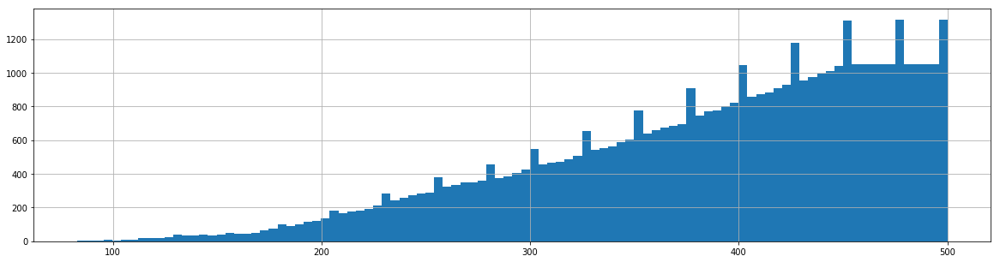

In [27]:
best.iteration.hist(bins=100);

In [28]:
best_iteration = best.sort_values('mean_dev_auc').groupby(['file', 'experiment_id']).last()

In [29]:
best_iteration.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

,count,mean,std,min,25%,50%,75%,max
param_boost_from_average,,,,,,,,
False,123.0,0.801231,0.008639,0.789929,0.792254,0.808220,0.809362,0.810756
True,140.0,0.802714,0.008355,0.790686,0.792483,0.808535,0.809534,0.810957


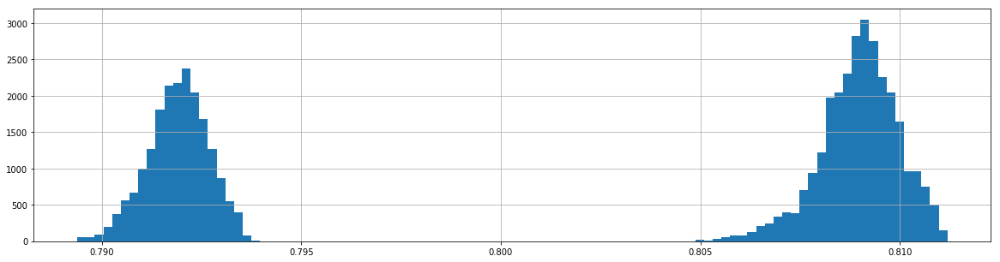

In [30]:
best.min_whole_validation_auc.hist(bins=100);

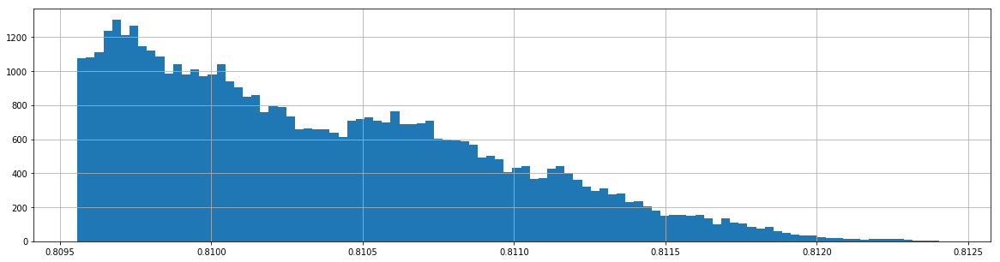

In [31]:
true_best.min_whole_validation_auc.hist(bins=100);

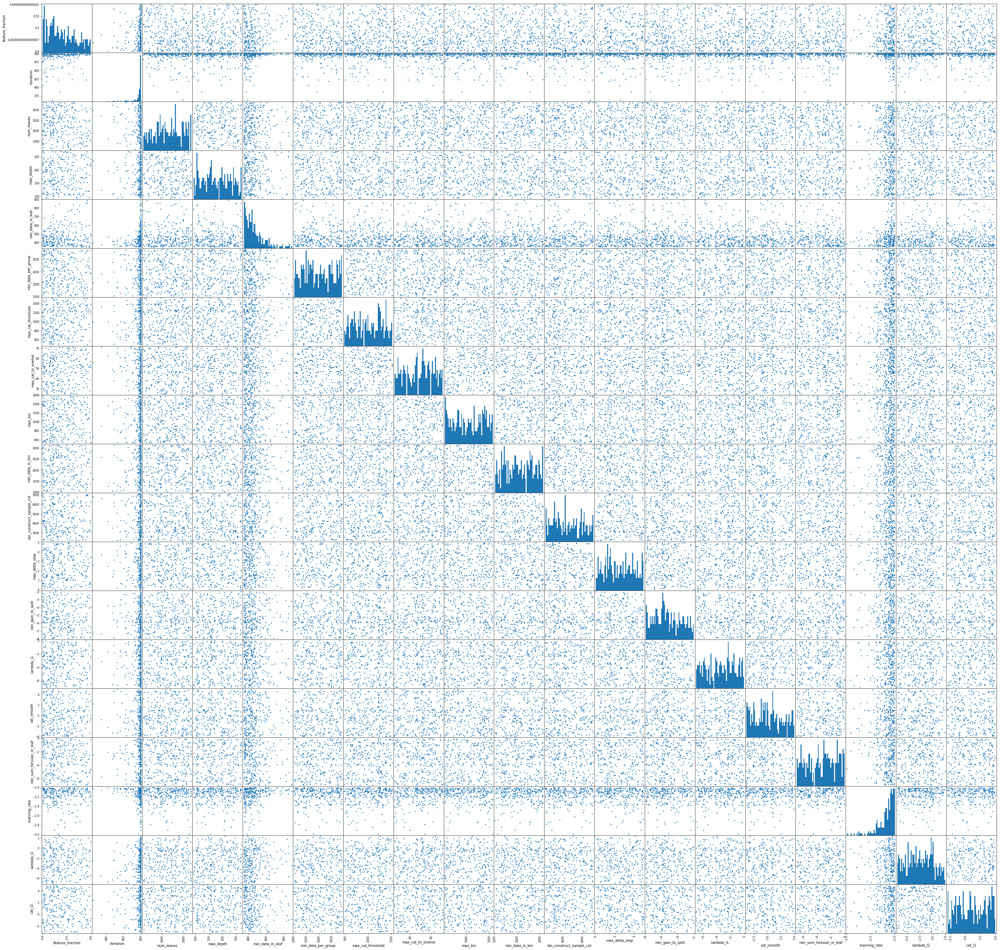

In [32]:
pd.plotting.scatter_matrix(
    pd.concat([best_iteration[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log10(best_iteration[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=1, figsize=(50, 50), hist_kwds={'bins': 50});

In [33]:
true_iteration = true_best.sort_values('min_whole_validation_auc').groupby(['file', 'experiment_id']).last()

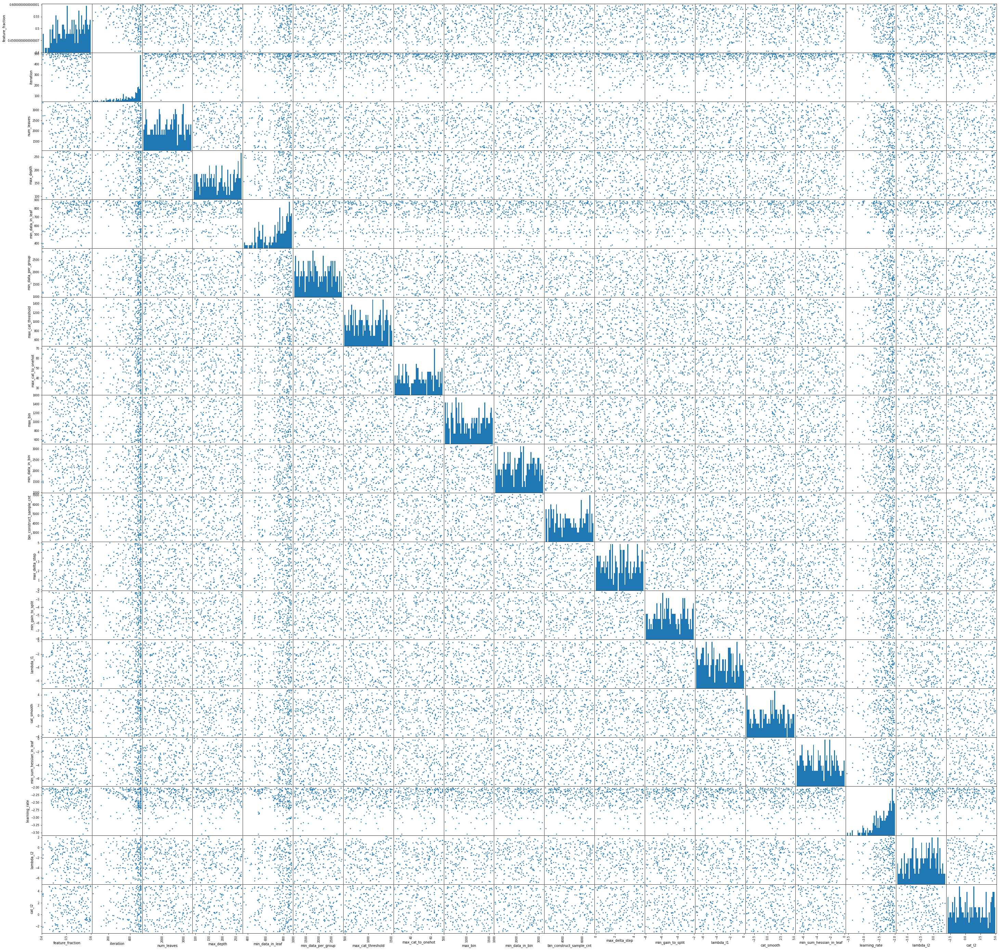

In [34]:
pd.plotting.scatter_matrix(
    pd.concat([true_iteration[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log10(true_iteration[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=1, figsize=(50, 50), hist_kwds={'bins': 50});

### check failures in best selected parameter range

In [35]:
best_range = best\
    [[c for c in best.columns if c.startswith('param_') and not c in SET_PARAMETERS]]\
    .drop(columns=['param_seed', 'param_bagging_enable'], errors='ignore')\
    .quantile([0, 1]).T
best_range

,0.0,1.0
param_bin_construct_sample_cnt,2.176000e+03,7117.000000
param_cat_l2,1.021177e-03,87151.102756
param_cat_smooth,1.107483e-04,89443.794826
param_feature_fraction,4.000434e-01,0.599124
param_lambda_l1,1.079841e-07,0.869116
param_lambda_l2,1.107920e-07,246.921683
param_learning_rate,1.017241e-03,0.009974
param_max_bin,5.330000e+02,1577.000000
param_max_cat_threshold,4.850000e+02,1518.000000
param_max_cat_to_onehot,2.500000e+01,71.000000


In [36]:
dfs = []
for f in files:
    df = pd.read_pickle(f).assign(file=f)
    for (n, l, h) in best_range.itertuples():
        df = df[(((df[n] >= l) & (df[n] <= h))
                 | df[n].isna())].copy()
    dfs.append(df)

limited = pd.concat(dfs, ignore_index=True, sort=True)
del dfs
limited.shape

(2053000, 51)

In [37]:
limited_best_iteration = limited.sort_values('min_whole_validation_auc').groupby(['file', 'experiment_id']).last()
limited_best_iteration.shape

(4106, 49)

In [38]:
limited_best_iteration.min_whole_validation_auc.describe()

count    4106.000000
mean        0.789954
std         0.009249
min         0.770411
25%         0.784121
50%         0.788160
75%         0.791441
max         0.812431
Name: min_whole_validation_auc, dtype: float64

In [39]:
limited_bad = limited_best_iteration[limited_best_iteration.min_whole_validation_auc < 0.6]

In [40]:
limited_bad.shape

(0, 49)

In [41]:
limited_bad.groupby(SET_PARAMETERS).size()

Series([], dtype: int64)

In [42]:
limited_best_iteration.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

,count,mean,std,min,25%,50%,75%,max
param_boost_from_average,,,,,,,,
False,2053.0,0.789388,0.009098,0.770411,0.783763,0.787774,0.791152,0.812385
True,2053.0,0.790520,0.009367,0.773726,0.784643,0.788467,0.791742,0.812431


### single best parameter set

In [43]:
single_best = best.iloc[0]

In [44]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(single_best)

cnt                                                               3
experiment_id                                                  4131
file                                    ./experiments/thin-only.pkl
iteration                                                       492
max_dev_auc                                                0.837431
max_dev_binary_logloss                                     0.539003
max_validation_auc                                         0.796779
max_validation_binary_logloss                              0.545277
max_whole_train_auc                                        0.841476
max_whole_train_binary_logloss                             0.496012
max_whole_validation_auc                                   0.810787
max_whole_validation_binary_logloss                        0.534339
mean_dev_auc                                               0.811423
mean_dev_binary_logloss                                    0.530378
mean_train_auc                                  

In [45]:
# todo generate 1% neighborhood around best parameter set